# Mémoire : corrélation entre géographie et toponymes - À la recherche de Trifouillis-les-Oies

##### Import des bibliothèques utilisées

In [1]:
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import style
import numpy as np
import folium

In [2]:
#Lecture de la base de données, l'encodage latin-1 permet de lire les caractères spéciaux

df = pd.read_csv("data2011.csv", sep="\t", encoding="latin-1", index_col="insee")

In [3]:
#transformation des coordonnées, exprimées en radians,  en degrés 
df[["longitude", "latitude"]] = df[["longitude", "latitude"]].apply(lambda alpha : alpha*180/np.pi)
df

,nom,altitude,code_postal,longitude,latitude,pop99,surface,departement,region,indicatif
insee,,,,,,,,,,
1001,L'Abergement-Clémenciat,257.0,1400,4.919167,46.152222,728,15.70,1,RA,4
1002,L'Abergement-de-Varey,367.0,1640,5.423889,46.007778,168,9.14,1,RA,4
1004,Ambérieu-en-Bugey,247.0,1500,5.348889,45.956112,11436,24.51,1,RA,4
1005,Ambérieux-en-Dombes,293.0,1330,4.904167,45.996113,1408,16.06,1,RA,4
1006,Ambléon,400.0,1300,5.602222,45.750278,86,6.03,1,RA,4
...,...,...,...,...,...,...,...,...,...,...
95676,Villers-en-Arthies,150.0,95510,1.726667,49.088890,426,8.43,95,IF,1
95678,Villiers-Adam,130.0,95840,2.235278,49.063057,775,9.89,95,IF,1
95680,Villiers-le-Bel,104.0,95400,2.389167,49.005833,26145,7.27,95,IF,1


In [4]:
region_index = {"FC": "Franche-Comté", "BO": "Bourgogne", "LO": "Lorraine", "NP": "Nord-Pas-de-Calais", "PI": "Picardie", \
                "RA": "Rhône-Alpes", "AU": "Auvergne", "PA": "PACA", "CA": "Champagne-Ardennes", "MP": "Midi-Pyrénées", \
                "BN": "Basse-Normandie", "PC": "Poitou-Charente", "CE": "Centre", "LI": "Limousin", "BR": "Bretagne", \
                "AQ": "Aquitaine", "FC": "Franche-Comté", "HN": "Haute-Normandie", "PL": "Pays de la Loire", "AL": "Alsace", \
                "IF": "Île-de-France", "LR": "Languedoc-Roussillon"}

In [5]:
#Cette fonction permet de récupérer les noms des régions d'après les codes leur ayant été attribué

def region_get_name(ls): 
    global region_index #on utilise le dictionnaire définit plus haut 
    region_name = list()
    for name in ls :
        region_name.append(region_index.get(name))
    return region_name

#### Anciennes provinces du Royaume de France

On regarde dans cette section quels sont les toponymes contenant des noms d'anciennes provinces de la France de l'Ancien Régime.

In [6]:
artois_filt = df["nom"].str.contains("Artois", na =False)
df_artois = df.loc[artois_filt]

In [7]:
df_artois

,nom,altitude,code_postal,longitude,latitude,pop99,surface,departement,region,indicatif
insee,,,,,,,,,,
62045,Aubigny-en-Artois,95.0,62690,2.590833,50.350555,1360,6.32,62,NP,3
62346,Fortel-en-Artois,120.0,62270,2.224722,50.258057,155,5.96,62,NP,3
62379,Gouy-en-Artois,115.0,62123,2.593056,50.247223,375,10.18,62,NP,3
62407,Ham-en-Artois,25.0,62190,2.455556,50.589722,989,3.32,62,NP,3
62469,Inchy-en-Artois,60.0,62860,3.050833,50.178612,556,11.18,62,NP,3
62649,Pas-en-Artois,95.0,62760,2.488333,50.155277,938,10.89,62,NP,3
62677,Le_Quesnoy-en-Artois,125.0,62140,2.046944,50.334167,332,8.03,62,NP,3
62864,Vis-en-Artois,65.0,62156,2.936111,50.248611,536,6.48,62,NP,3
62865,Vitry-en-Artois,45.0,62490,2.981944,50.323891,4606,18.70,62,NP,3


In [8]:
france = folium.Map(location= [46.856578, 2.351828], width=600, heigth=600, zoom_start= 5.5)
fg = folium.FeatureGroup(name="Artois Map")

for name, lat, long in zip(df_artois.nom, df_artois.latitude, df_artois.longitude) : 
    fg.add_child(folium.CircleMarker(location= (lat, long), radius=.3, fill_opacity=.7, popup=name))
france.add_child(fg)

In [9]:
anjou_filt = df["nom"].str.contains(r"\bAnjou\b")#, na =False)
df_anjou = df.loc[anjou_filt]

provence_filt = df["nom"].str.contains("Provence", na =False)
df_provence = df.loc[provence_filt]

touraine_filt = df["nom"].str.contains("Touraine", na =False)
df_touraine = df.loc[touraine_filt] 

champagne_filt = df["nom"].str.contains(r"\bChampagne\b", na =False)
df_champagne = df.loc[champagne_filt]

In [10]:
#on regarde quels départements contiennent le plus gros contingent du mot "Touraine"
df_touraine.departement.value_counts(normalize=True)*100 

37    92.857143
41     7.142857
Name: departement, dtype: float64

In [11]:
#on fusionne les données dans le but de les afficher sur une carte
df_provinces = pd.concat([df_provence, df_touraine, df_artois, df_anjou, df_champagne])

In [12]:
#cette fonction attribue une couleur au toponyme, selon le nom qu'elle contient.

def color_producer_1(name):
    if "Touraine" in name:
        return 'red'
    elif "Provence" in name :
        return '#228B22'
    elif "Artois" in name :
        return "orange"
    elif "Anjou" in name : 
        return "#DAA520"
    elif "Champagne" in name :
        return "#1E90FF"
    else:
        return None

In [13]:
#On crée la carte, auquel on ajoute les toponymes de la dataframe df_provinces
#le par

france = folium.Map(location= [46.856578, 2.351828], width=600, heigth=600, zoom_start= 5.5)
fg = folium.FeatureGroup(name="Touraine / Provence Map")

for name, lat, long in zip(df_provinces.nom, df_provinces.latitude, df_provinces.longitude) : 
    
    """La classe CircleMarker permet de créer un point à afficher selon les coordonnées spécifiées,
    et de le colorer selon la fonction que nous avons créée."""
    
    circle_marker = folium.CircleMarker(location= (lat, long), radius=.7, \
                                     fill_color=color_producer_1(name), color=color_producer_1(name), fill_opacity=.7, popup=name)
    fg.add_child(circle_marker)
france.add_child(fg)

france

#### Présence de la préposition lès / lez

In [14]:
#On définit à nouveau nos filtres afin de sélectionner les toponymes contenants les prépositions lès / lez

filt_les = df["nom"].str.contains("-lès-", na =False)
filt_lez = df["nom"].str.contains("-lez-", na =False)

#On choisit de ne garder que les 5 regions les plus representees dans les occurences de la preposition
#on ne garde que 2 chiffres significatifs pour exprimer les pourcentages

prop_les = round(df.loc[filt_les|filt_lez].region.value_counts(normalize=True).nlargest(5)*100, 2)

Text(0.5, 0, 'Proportion (%)')

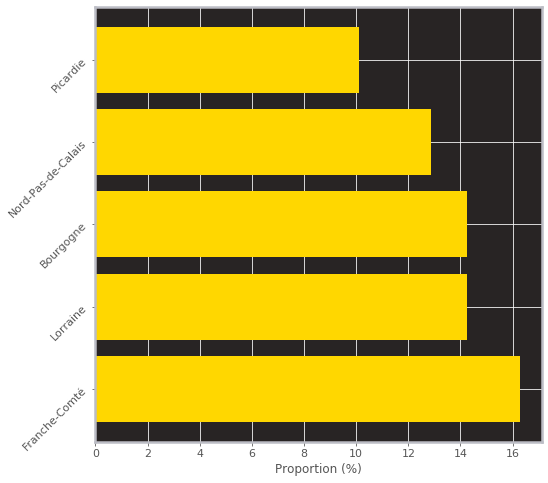

In [15]:
style.use('ggplot')
mpl.rc('ytick', labelsize=11) 
mpl.rc('xtick', labelsize=11) 

fig= plt.figure(figsize= (8, 8))
ax= fig.add_subplot(111)

plt.rcParams["font.family"] = "serif"

for ylabel in ax.yaxis.get_ticklabels() :
        ylabel.set_rotation(45)

position = ["left", "right", "top", "bottom"]

ax.set_facecolor("#282424")
for pos in position :
    ax.spines[pos].set_color("#BCBDC5")
    ax.spines[pos].set_linewidth(2.5)
        
plt.barh(region_get_name(prop_les.index), prop_les, color="#FFD700")
plt.xlabel("Proportion (%)")
#plt.title('Poids des régions dans l\'occurence de la préposition "lès" ("lez")')
#fig.savefig("lez_les_graphique.png", facecolor=fig.get_facecolor(), bbox_inches="tight")

In [16]:
df.loc[filt_lez]

,nom,altitude,code_postal,longitude,latitude,pop99,surface,departement,region,indicatif
insee,,,,,,,,,,
8319,Neuville-lez-Beaulieu,250.0,8380,4.326944,49.869446,265,36.00,8,CA,3
10076,Champignol-lez-Mondeville,260.0,10200,4.674167,48.139168,305,44.02,10,CA,3
14759,Villy-lez-Falaise,100.0,14700,-0.136111,48.898335,229,5.11,14,BN,2
25495,Roche-lez-Beaupré,250.0,25220,6.114167,47.276112,2062,5.60,25,FC,3
34183,Nissan-lez-Enserune,20.0,34440,3.128889,43.290001,2907,30.36,34,LR,4
45044,Bougy-lez-Neuville,129.0,45170,2.026667,48.039722,177,16.97,45,CE,2
45204,Mézières-lez-Cléry,97.0,45370,1.806111,47.818611,604,26.97,45,CE,2
45254,Poilly-lez-Gien,125.0,45500,2.597778,47.677776,2189,33.37,45,CE,2
59029,Auchy-lez-Orchies,45.0,59310,3.203333,50.478333,1156,7.83,59,NP,3


In [17]:
df.loc[filt_lez].departement.value_counts(normalize=True)*100

59    65.217391
45    13.043478
25     4.347826
14     4.347826
10     4.347826
8      4.347826
34     4.347826
Name: departement, dtype: float64

In [18]:
df.loc[filt_les].departement.value_counts(normalize=True)*100

70    11.250000
62    10.357143
21     9.464286
57     7.500000
2      4.821429
        ...    
83     0.178571
24     0.178571
68     0.178571
38     0.178571
27     0.178571
Name: departement, Length: 61, dtype: float64

In [19]:
df.loc[filt_les|filt_lez]

,nom,altitude,code_postal,longitude,latitude,pop99,surface,departement,region,indicatif
insee,,,,,,,,,,
1136,Cruzilles-lès-Mépillat,215.0,1290,4.880278,46.224998,651,11.90,1,RA,4
1344,Saint-Denis-lès-Bourg,230.0,1000,5.187778,46.203609,4921,12.61,1,RA,4
2091,Blanzy-lès-Fismes,150.0,2160,3.673889,49.337776,94,5.27,2,PI,2
2096,Bois-lès-Pargny,138.0,2270,3.649722,49.731667,172,10.43,2,PI,2
2132,Bucy-lès-Cerny,120.0,2870,3.518611,49.582500,170,8.81,2,PI,2
...,...,...,...,...,...,...,...,...,...,...
95019,Arnouville-lès-Gonesse,63.0,95400,2.416944,48.992500,12291,2.92,95,IF,1
95154,Chennevières-lès-Louvres,100.0,95380,2.551944,49.044445,218,4.63,95,IF,1
95212,Épiais-lès-Louvres,115.0,95380,2.557778,49.030556,60,3.43,95,IF,1


In [20]:
def color_producer(name):
    if "-lès-" in name:
        return 'blue'
    elif "-lez-" in name :
        return 'orange'
    else:
        return None
"""  
On modifie la fonction color_producer afin de s'adapter à ce que l'on regarde
"""

"  \nOn modifie la fonction color_producer afin de s'adapter à ce que l'on regarde\n"

In [21]:
df_les_lez = df[filt_les|filt_lez] #on regroupe les toponymes contenant lès ou lez


france = folium.Map(location= [46.856578, 2.351828], width=600, heigth=600, zoom_start= 5.5)
fg = folium.FeatureGroup(name="lès / lez Map")

for name, lat, long in zip(df_les_lez.nom, df_les_lez.latitude, df_les_lez.longitude) : 
    fg.add_child(folium.CircleMarker(location= (lat, long), radius=.7, \
                                     fill_color=color_producer(name), color=color_producer(name), fill_opacity=.7, popup=name))
france.add_child(fg)

france

#france.save("lès_lez_map.png")

In [22]:
prop_champagne = df_champagne.region.value_counts(normalize=True)*100

In [23]:
prop_champagne

PL    24.324324
CA    24.324324
PC    18.918919
IF     8.108108
RA     8.108108
CE     8.108108
BO     2.702703
FC     2.702703
AQ     2.702703
Name: region, dtype: float64

In [24]:
df.loc[df.nom.str.contains("dieu", case=False)]

,nom,altitude,code_postal,longitude,latitude,pop99,surface,departement,region,indicatif
insee,,,,,,,,,,
7138,Lavilledieu,229.0,7170,4.453333,44.577499,1430,14.91,7,RA,4
8300,Le_Mont-Dieu,200.0,8390,4.867500,49.547222,24,18.86,8,CA,3
8463,Vaux-en-Dieulet,205.0,8240,4.991667,49.484444,69,10.96,8,CA,3
11158,Gaja-et-Villedieu,200.0,11300,2.188611,43.080555,266,8.08,11,LR,5
15262,Villedieu,940.0,15100,3.065000,45.002777,515,19.14,15,AU,4
16157,Le_Grand-Madieu,173.0,16450,0.444444,45.939445,149,8.40,16,PC,5
17471,La_Villedieu,80.0,17470,-0.321111,46.062222,264,22.21,17,PC,5
19142,Monestier-Port-Dieu,700.0,19110,2.501389,45.491943,116,18.74,19,LI,5
19167,Confolent-Port-Dieu,760.0,19200,2.497500,45.544167,39,10.80,19,LI,5


#### Un peu d'allemand

In [25]:
heim_df = df.loc[df.nom.str.contains("heim", case=False)]
round(heim_df.departement.value_counts(normalize=True)*100, 2)

67    67.90
68    29.22
57     2.88
Name: departement, dtype: float64

In [26]:
dorf_df = df.loc[df.nom.str.contains("dorf", case=False)]
round(dorf_df.departement.value_counts(normalize=True)*100, 2)

67    51.16
68    34.88
57    13.95
Name: departement, dtype: float64

In [27]:
def color_producer_de(name):
    if "heim" in name:
        return 'blue'
    elif "dorf" in name :
        return 'orange'
    else:
        return None

In [28]:
df_deutsch = pd.concat([heim_df, dorf_df]) #on regroupe les toponymes contenant heim ou dorf

france = folium.Map(location= [46.856578, 2.351828], width=600, heigth=600, zoom_start= 5.5)
fg = folium.FeatureGroup(name="Heim / Dorf Map")

for name, lat, long in zip(df_deutsch.nom, df_deutsch.latitude, df_deutsch.longitude) : 
    fg.add_child(folium.CircleMarker(location= (lat, long), radius=.7, \
                                     fill_color=color_producer_de(name), color=color_producer_de(name), fill_opacity=.7, popup=name))
france.add_child(fg)

france

In [29]:
df.loc[df.nom.str.contains("sch", case=False)].region.value_counts(normalize=True)*100

AL    56.716418
LO    17.910448
NP     4.477612
RA     3.731343
FC     2.985075
PI     2.985075
IF     2.238806
LI     2.238806
CA     2.238806
AU     1.492537
PC     0.746269
PL     0.746269
HN     0.746269
CE     0.746269
Name: region, dtype: float64

In [30]:
df.loc[df.nom.str.endswith("euc")]

,nom,altitude,code_postal,longitude,latitude,pop99,surface,departement,region,indicatif
insee,,,,,,,,,,
11201,Leuc,134.0,11250,2.323889,43.148609,577,11.75,11,LR,5
22001,Allineuc,180.0,22460,-2.872500,48.311943,497,24.35,22,BR,2
22003,Aucaleuc,100.0,22100,-2.126944,48.455833,629,6.51,22,BR,2
22278,Saint-Brieuc,100.0,22000,-2.773056,48.514168,46087,19.47,22,BR,2
22281,Saint-Carreuc,200.0,22150,-2.730833,48.398609,1227,13.17,22,BR,2
22309,Saint-Launeuc,147.0,22230,-2.371944,48.233334,194,11.72,22,BR,2
22368,Tréméreuc,68.0,22490,-2.062222,48.558056,566,4.12,22,BR,2
22377,Tréveneuc,50.0,22410,-2.869167,48.664722,593,6.69,22,BR,2
35226,Pleugueneuc,67.0,35720,-1.901111,48.397221,1283,24.84,35,BR,2


##### Terminaison en ac / ach

In [31]:
filt_ac = df.nom.str.endswith("ac")#on regarde les toponymes finissant par ac
filt_ach = df.nom.str.endswith("ach")
filt_euc = df.nom.str.endswith("euc")

In [32]:
round(df.loc[filt_ach].departement.value_counts(normalize=True)*100, 2)

68    36.89
67    34.95
57    17.48
66     3.88
56     1.94
88     0.97
46     0.97
33     0.97
29     0.97
11     0.97
Name: departement, dtype: float64

In [33]:
def color_producer_ac(name):
    if (("ac" in name) and ("ach" not in name)) :
        return 'blue'
    elif "ach" in name :
        return 'red'
    elif "euc" in name:
        return "orange"
    else :
        return None

In [34]:
df.loc[filt_ac].region.value_counts(normalize=True)

MP    0.275416
AQ    0.229205
PC    0.143253
LI    0.081331
LR    0.074861
AU    0.066543
BR    0.053604
RA    0.032348
PL    0.011091
PA    0.010166
CE    0.007394
FC    0.002773
CA    0.002773
NP    0.002773
PI    0.001848
BO    0.001848
BN    0.001848
HN    0.000924
Name: region, dtype: float64

In [35]:
df_ac_gp = df.loc[filt_ac].groupby("region")

In [36]:
df_ac_gp.get_group("AQ").departement.value_counts()

33    103
24    103
47     35
40      6
64      1
Name: departement, dtype: int64

In [37]:
df_ac_gp.get_group("PC").departement.value_counts(normalize=True)

16    0.567742
17    0.400000
86    0.032258
Name: departement, dtype: float64

In [38]:
#on regarde quelles sont les 9 régions les plus représentées dans les toponymes finissant par ac
region_ac = df.loc[filt_ac].region.value_counts(normalize=True)

In [39]:
filt_region_ac = df.region.isin(region_ac.index) #on ne garde que les neuf régions les plus représentées

In [40]:
#on récupère la dataframe ne contenant que les toponymes finissant par ac et se trouvant dans les neuf régions les plus représentées
df_ac = df.loc[filt_ac|filt_ach|filt_euc]# & filt_region_ac] 

In [41]:
france = folium.Map(location= [46.856578, 2.351828], width=600, heigth=600, zoom_start= 5.5)
fg = folium.FeatureGroup(name="endswith ac Map")

for name, lat, long in zip(df_ac.nom, df_ac.latitude, df_ac.longitude) : 
     fg.add_child(folium.CircleMarker(location= (lat, long), radius=.7, \
                                     fill_color=color_producer_ac(name), color=color_producer_ac(name), fill_opacity=.7, popup=name))
france.add_child(fg)


france

In [42]:
df_e_y = df.loc[df.nom.str.endswith("y")|df.nom.str.endswith("é")]

In [43]:
df_y = df.loc[df.nom.str.endswith("y")]
df_y_nb = df_y.region.value_counts()

df_e = df.loc[df.nom.str.endswith("é")]
df_e_nb = df_e.region.value_counts()

In [44]:
df_e.region.value_counts().sum()

734

In [45]:
round(df_y_nb*100,2).nlargest(5)

BO    52000
CA    38200
PI    37600
FC    29600
CE    28700
Name: region, dtype: int64

In [46]:
df_e_y_nb = df_e_y.region.value_counts(ascending=True)

In [47]:
df_e_y_nb

LI      7
PA     12
AL     14
LR     37
AU     61
AQ     74
MP    107
NP    120
BR    146
HN    157
IF    188
PC    213
BN    256
RA    279
PL    290
LO    293
FC    305
CE    354
CA    398
PI    398
BO    549
Name: region, dtype: int64

In [48]:
nb_region = df.region.value_counts()

In [49]:
df_e_prop = round((df_e_nb / nb_region)*100, 2)
df_y_prop = round((df_y_nb / nb_region)*100, 2)

In [50]:
df_y_prop

AL     0.88
AQ     2.87
AU     4.43
BN    11.75
BO    25.42
BR     4.81
CA    19.60
CE    15.58
FC    16.58
HN    10.21
IF    13.66
LI     0.80
LO    12.14
LR     2.14
MP     2.02
NP     7.18
PA     1.04
PC     7.25
PI    16.41
PL     5.39
RA     8.51
Name: region, dtype: float64

In [51]:
df_e_fin = pd.concat([df_e_y_nb, df_e_prop, df_y_prop], axis=1)
df_e_fin.columns = ["Nombre", "prop_e", "prop_y"]
df_e_fin.index.name = "Région"

In [52]:
df_e_fin

,Nombre,prop_e,prop_y
Région,,,
LI,7,0.13,0.80
PA,12,0.21,1.04
AL,14,0.66,0.88
LR,37,0.26,2.14
AU,61,0.23,4.43
AQ,74,0.35,2.87
MP,107,1.52,2.02
NP,120,0.58,7.18
BR,146,6.70,4.81


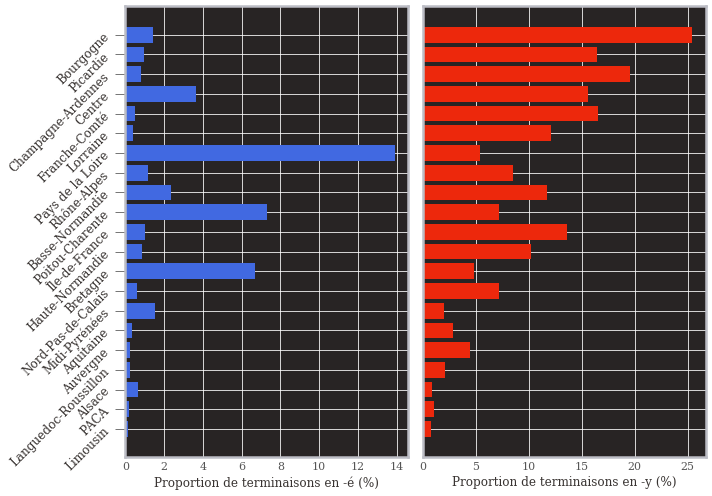

In [53]:
style.use('ggplot')

fig= plt.figure(figsize= (10, 7))
ax1= fig.add_subplot(121)
ax2= fig.add_subplot(122, sharey=ax1)


plt.rcParams["font.family"] = "serif"

position = ["left", "right", "top", "bottom"]

for axe in fig.axes : 
    axe.set_facecolor("#282424")
    for pos in position :
        axe.spines[pos].set_color("#BCBDC5")
        axe.spines[pos].set_linewidth(2.5)

#ylabels
for ylabel1 in ax1.yaxis.get_ticklabels() :
    ylabel1.set_rotation(45)

font_dict = {"family":"serif", "color":"#393432"}
font_dict1 = {"family": "serif", "color": "#393432", "size": 14}
font_dict2 = {"family": "serif", "color": "#393432", "size": 12}

for axe, obj, color, title, pad in zip(fig.axes, [df_e_fin.prop_e, df_e_fin.prop_y],['#4169E1', "#ED280C"],\
                                       ["Proportion de terminaisons en -é (%)", "Proportion de terminaisons en -y (%)"], [5, 5]) :
    axe.barh(df_e_fin.index, obj, color=color)
    axe.set_xlabel(title, fontdict= font_dict2)
    
    
ax1.set_yticklabels(labels= region_get_name(df_e_fin.index), fontdict= font_dict2)

#ax1.set_xticklabels(labels= np.arange(0, 600, 100), fontdict= font_dict2)
#ax2.set_xticklabels(labels= np.arange(0, 40, 5), fontdict= font_dict2)


ax1.tick_params(axis="y", length=10) 
ax1.tick_params(axis="x", length=0, pad= 4)
ax2.tick_params(labelleft=False)
ax2.tick_params(axis="x", length=0, pad= 4)
ax2.tick_params(axis="y", length=0)


#fig.suptitle("Etude de la répartition des communes françaises portant le nom d'un Saint ", fontdict= font_dict, x=.53, y=1.03, fontsize=15.5)

fig.tight_layout()

fig.savefig("terminaison_y_e.png", facecolor=fig.get_facecolor(), bbox_inches="tight")

In [54]:
def color_producer_y(name):
    if name[-1] == "y" and name[-2] == "a" :
        return 'blue'
    elif name[-1] == "é" :
        return '#0BF906'
    elif name[-1] == "y" and name[-2] != "a" :
        return "orange"
    else :
        return None

In [55]:
france = folium.Map(location= [46.856578, 2.351828], width=600, heigth=600, zoom_start= 5.5)
fg = folium.FeatureGroup(name="endswith ac Map")

for name, lat, long in zip(df_e_y.nom, df_e_y.latitude, df_e_y.longitude) : 
     fg.add_child(folium.CircleMarker(location= (lat, long), radius=.5,\
                                      fill_color=color_producer_y(name), color=color_producer_y(name), fill_opacity=.7, popup=name))
france.add_child(fg)


france

#### Au fil de l'eau

In [56]:
filt_saone = df.nom.str.contains("Saône", na=False)
filt_garonne = df.nom.str.contains("Garonne", na=False)
filt_loire = df.nom.str.contains("Loire", na=False)
filt_seine = df.nom.str.contains("Seine", na=False)
filt_meuse = df.nom.str.contains("Meuse", na=False)

df_fleuves = df.loc[filt_saone|filt_loire|filt_seine|filt_meuse|filt_garonne]

In [57]:
france = folium.Map(location= [46.856578, 2.351828], width=600, heigth=600, zoom_start= 5.5)
fg = folium.FeatureGroup(name="Fleuves Map")

for name, lat, long in zip(df_fleuves.nom, df_fleuves.latitude, df_fleuves.longitude) : 
     fg.add_child(folium.CircleMarker(location= (lat, long), radius=.5, fill_opacity=.7, popup=name))
france.add_child(fg)


france

#### Mont et Puy

In [58]:
df_puy = df.loc[df.nom.str.contains("puy", case=False)]

In [59]:
df_puy

,nom,altitude,code_postal,longitude,latitude,pop99,surface,departement,region,indicatif
insee,,,,,,,,,,
3235,Saint-Gérand-le-Puy,320.0,3150,3.512778,46.257221,1029,19.66,3,AU,4
5107,Puy-Saint-André,1516.0,5100,6.598333,44.878334,462,15.33,5,PA,4
5108,Puy-Saint-Eusèbe,1280.0,5200,6.419167,44.563889,115,11.21,5,PA,4
5109,Puy-Saint-Pierre,1540.0,5100,6.617500,44.892776,354,7.85,5,PA,4
5110,Puy-Saint-Vincent,1400.0,5290,6.485000,44.831112,267,22.70,5,PA,4
...,...,...,...,...,...,...,...,...,...,...
84094,Puyméras,364.0,84110,5.129167,44.269169,610,14.84,84,PA,4
84095,Puyvert,200.0,84160,5.343889,43.759998,541,10.02,84,PA,4
85184,Puy-de-Serre,100.0,85240,-0.665278,46.562222,320,13.87,85,PL,2


In [60]:
round(df_puy.region.value_counts(normalize=True)*100, 2)#.nlargest(5).sum()*100, 2)

MP    32.93
AQ    19.51
PA    10.98
PC     8.54
AU     7.32
RA     6.10
PL     3.66
LR     3.66
LI     2.44
CE     2.44
BO     1.22
FC     1.22
Name: region, dtype: float64

In [61]:
france = folium.Map(location= [46.856578, 2.351828], width=600, heigth=600, zoom_start= 5.5)
fg = folium.FeatureGroup(name="Fleuves Map")

for name, lat, long in zip(df_puy.nom, df_puy.latitude, df_puy.longitude) : 
     fg.add_child(folium.CircleMarker(location= (lat, long), radius=.5, fill_opacity=.7, popup=name))
france.add_child(fg)


france

In [62]:
df_start_mont = df.loc[df.nom.str.startswith("Mont")]
df_end_mont = df.loc[df.nom.str.endswith("mont")]


In [63]:
df_start_mont

,nom,altitude,code_postal,longitude,latitude,pop99,surface,departement,region,indicatif
insee,,,,,,,,,,
1254,Montagnat,262.0,1250,5.284722,46.171665,1421,13.86,1,RA,4
1255,Montagnieu,320.0,1470,5.470833,45.793331,386,6.19,1,RA,4
1257,Montanges,604.0,1200,5.800833,46.164722,282,13.73,1,RA,4
1258,Montceaux,216.0,1090,4.796389,46.098057,908,10.12,1,RA,4
1259,Montcet,245.0,1310,5.111389,46.213612,489,6.57,1,RA,4
...,...,...,...,...,...,...,...,...,...,...
95426,Montlignon,70.0,95680,2.284722,49.008888,2427,2.80,95,IF,1
95427,Montmagny,51.0,95360,2.343056,48.973610,13090,2.89,95,IF,1
95428,Montmorency,133.0,95160,2.321667,48.988335,20599,5.19,95,IF,1


In [64]:
df_start_mont.groupby("region").get_group("RA").departement.value_counts(normalize=True)
#on regarde le poids des departements dans les occurrences des toponymes commençant par "Mont" au sein de la region RA

26    0.292683
73    0.182927
38    0.170732
1     0.134146
42    0.073171
69    0.060976
74    0.048780
7     0.036585
Name: departement, dtype: float64

In [65]:
df_end_mont

,nom,altitude,code_postal,longitude,latitude,pop99,surface,departement,region,indicatif
insee,,,,,,,,,,
1011,Apremont,900.0,1100,5.663611,46.209999,329,15.09,1,RA,4
1074,Chalamont,300.0,1320,5.171944,45.996387,1658,33.02,1,RA,4
2079,Besmont,175.0,2500,4.121389,49.838612,146,15.81,2,PI,2
2145,Caumont,81.0,2300,3.177222,49.633057,474,5.80,2,PI,2
2227,Courmont,170.0,2130,3.576944,49.148888,113,10.12,2,PI,2
...,...,...,...,...,...,...,...,...,...,...
95074,Boisemont,150.0,95000,2.007500,49.023888,690,2.02,95,IF,1
95091,Bouffémont,114.0,95570,2.297500,49.042221,5701,4.58,95,IF,1
95141,Charmont,100.0,95420,1.791111,49.135277,32,3.86,95,IF,1


In [66]:
df_end_mont.region.value_counts(normalize=True)

LO    0.199461
PI    0.123989
CA    0.115903
FC    0.110512
MP    0.070081
NP    0.056604
RA    0.056604
HN    0.048518
IF    0.035040
AQ    0.029650
BN    0.024259
BO    0.024259
PL    0.021563
CE    0.016173
AU    0.016173
LR    0.013477
PC    0.013477
LI    0.008086
PA    0.008086
AL    0.005391
BR    0.002695
Name: region, dtype: float64

In [67]:
df_mer = df.loc[df.nom.str.endswith("Mer")]

In [68]:
df_mer

,nom,altitude,code_postal,longitude,latitude,pop99,surface,departement,region,indicatif
insee,,,,,,,,,,
6011,Beaulieu-sur-Mer,20.0,6310,7.327778,43.706390,3675,1.09,6,PA,4
6027,Cagnes-sur-Mer,20.0,6800,7.148056,43.666668,43942,18.24,6,PA,4
6138,Théoule-sur-Mer,3.0,6590,6.939722,43.506943,1296,10.74,6,PA,4
6159,Villefranche-sur-Mer,20.0,6230,7.308056,43.705002,6833,4.84,6,PA,4
11285,Peyriac-de-Mer,10.0,11440,2.958611,43.088612,828,35.45,11,LR,5
...,...,...,...,...,...,...,...,...,...,...
85166,Olonne-sur-Mer,20.0,85340,-1.771667,46.536945,10060,46.08,85,PL,2
85201,Saint-Benoist-sur-Mer,5.0,85540,-1.353889,46.423889,319,15.58,85,PL,2
85243,Brem-sur-Mer,5.0,85470,-1.830278,46.605831,2054,16.21,85,PL,2


In [69]:
france = folium.Map(location= [46.856578, 2.351828], width=600, heigth=300, zoom_start= 5.5)
fg = folium.FeatureGroup(name="Fleuves Map")

for name, lat, long in zip(df_mer.nom, df_mer.latitude, df_mer.longitude) : 
     fg.add_child(folium.CircleMarker(location= (lat, long), radius=.5, fill_opacity=.7, popup=name))
france.add_child(fg)


france

In [70]:
df_bois = df.loc[df.nom.str.contains("Bois")]

In [71]:
df_foret = df.loc[df.nom.str.contains("forêt", case=False)]

In [72]:
df_foret.nom.count()

55

In [73]:
df_bois.nom.count()

318

In [74]:
df_bois.region.value_counts(normalize=True)*100

IF    11.006289
CE     9.433962
HN     8.805031
PL     8.490566
PI     8.490566
BN     6.918239
NP     6.603774
LO     5.974843
CA     5.660377
BO     5.660377
PC     5.345912
FC     4.088050
RA     3.459119
AQ     2.515723
BR     1.886792
LR     1.572327
MP     1.572327
LI     1.572327
AU     0.628931
AL     0.314465
Name: region, dtype: float64

## Exploration de données et études statistiques

### Saints de France

In [75]:
filt_st = df["nom"].str.contains("Saint-|Sainte-|Saints-|Saintes-", case=True, na=False)
df.loc[filt_st]

,nom,altitude,code_postal,longitude,latitude,pop99,surface,departement,region,indicatif
insee,,,,,,,,,,
1054,Bourg-Saint-Christophe,250.0,1800,5.161944,45.891945,824,8.92,1,RA,4
1056,Boyeux-Saint-Jérôme,540.0,1640,5.455000,46.031387,277,16.70,1,RA,4
1331,Saint-Alban,520.0,1450,5.453889,46.095833,133,8.17,1,RA,4
1332,Saint-André-de-Bâgé,200.0,1380,4.924444,46.303055,507,2.74,1,RA,4
1333,Saint-André-de-Corcy,290.0,1390,4.953889,45.926109,3101,21.05,1,RA,4
...,...,...,...,...,...,...,...,...,...,...
95563,Saint-Leu-la-Forêt,76.0,95320,2.243889,49.014442,15127,5.31,95,IF,1
95566,Saint-Martin-du-Tertre,180.0,95270,2.348611,49.106945,2346,11.74,95,IF,1
95572,Saint-Ouen-l'Aumône,42.0,95310,2.112222,49.041943,19660,13.94,95,IF,1


In [76]:
Dieu_filt = df.nom.str.startswith("Dieu")
df.loc[Dieu_filt|df.nom.str.contains("Dieu|dieu")|df.nom.str.endswith("dieu")]#.region.value_counts(normalize=True)

,nom,altitude,code_postal,longitude,latitude,pop99,surface,departement,region,indicatif
insee,,,,,,,,,,
7138,Lavilledieu,229.0,7170,4.453333,44.577499,1430,14.91,7,RA,4
8300,Le_Mont-Dieu,200.0,8390,4.867500,49.547222,24,18.86,8,CA,3
8463,Vaux-en-Dieulet,205.0,8240,4.991667,49.484444,69,10.96,8,CA,3
11158,Gaja-et-Villedieu,200.0,11300,2.188611,43.080555,266,8.08,11,LR,5
15262,Villedieu,940.0,15100,3.065000,45.002777,515,19.14,15,AU,4
16157,Le_Grand-Madieu,173.0,16450,0.444444,45.939445,149,8.40,16,PC,5
17471,La_Villedieu,80.0,17470,-0.321111,46.062222,264,22.21,17,PC,5
19142,Monestier-Port-Dieu,700.0,19110,2.501389,45.491943,116,18.74,19,LI,5
19167,Confolent-Port-Dieu,760.0,19200,2.497500,45.544167,39,10.80,19,LI,5


In [77]:
dieu_filt = df.nom.str.contains("dieu")
df.loc[dieu_filt].nom.count()

29

In [78]:
#on recherche le nombre d'occurrences de Notre-Dame
df.loc[df.nom.str.contains("Notre-Dame")].nom.count()

54

In [79]:
#on cherche le nom de Marie sous d'autres formes que Sainte-Marie
df.loc[df.nom.str.contains("Marie|marie") & ~df.nom.str.contains("Sainte-|Saint-|Saintes-")]

,nom,altitude,code_postal,longitude,latitude,pop99,surface,departement,region,indicatif
insee,,,,,,,,,,
6080,Marie,602.0,6420,7.138056,44.033333,50,14.71,6,PA,4
25194,Dannemarie,470.0,25310,6.898333,47.391945,102,2.29,25,FC,3
25195,Dannemarie-sur-Crète,286.0,25410,5.864722,47.206669,938,4.16,25,FC,3
27195,Dame-Marie,175.0,27160,0.996667,48.807220,89,11.48,27,HN,2
28122,Dammarie,145.0,28360,1.496389,48.343056,1371,32.78,28,CE,2
37095,Dame-Marie-les-Bois,117.0,37110,1.032222,47.540558,275,9.12,37,CE,2
42183,La_Ricamarie,577.0,42150,4.367778,45.406666,8438,6.94,42,RA,4
45120,Dammarie-en-Puisaye,180.0,45420,2.872500,47.627220,155,25.87,45,CE,2
45121,Dammarie-sur-Loing,160.0,45230,2.882222,47.784443,467,21.02,45,CE,2


In [80]:
df.groupby("region").get_group("BR").loc[df.nom.str.contains("Loc")].nom.count()
#on regarde le nombre de toponyme bretons contenant "loc"

24

### Répartition des communes françaises

In [81]:
topo_prop = round(df.region.value_counts(normalize=True, ascending=True), 4)*100

#La région MP représente 8,34% des localités françaises
#8,34% des localités françaises se trouvent en Midi-Pyrénées

In [82]:
topo_prop

LI    2.06
AL    2.50
PA    2.66
BR    3.50
IF    3.54
AU    3.62
HN    3.92
PC    4.04
PL    4.15
LR    4.27
NP    4.27
FC    4.93
BN    5.01
CE    5.09
CA    5.38
BO    5.65
PI    6.33
AQ    6.34
LO    6.46
RA    7.95
MP    8.34
Name: region, dtype: float64

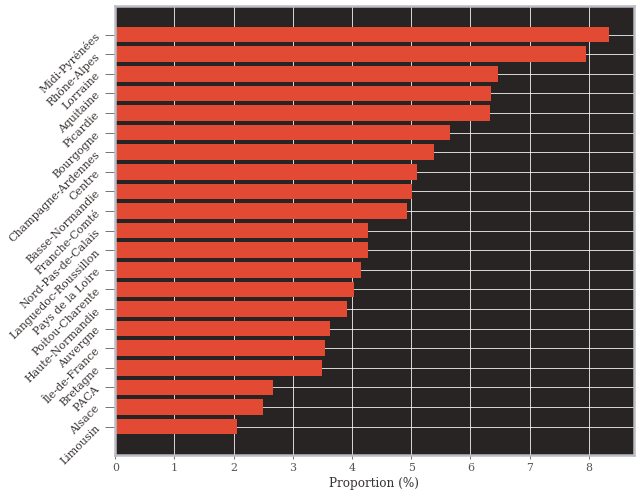

In [83]:
style.use('ggplot')

fig= plt.figure(figsize= (9, 7))
ax= fig.add_subplot(111)


plt.rcParams["font.family"] = "serif"

position = ["left", "right", "top", "bottom"]

ax.set_facecolor("#282424")
for pos in position :
    ax.spines[pos].set_color("#BCBDC5")
    ax.spines[pos].set_linewidth(2.5)

#ylabels
for ylabel in ax.yaxis.get_ticklabels() :
    ylabel.set_rotation(45)


font_dict= {"family": "serif", "color": "#393432", "size": 11}
font_dict1 = {"family": "serif", "color": "#393432", "size": 12}

ax.barh(region_get_name(topo_prop.index), topo_prop.values)
    
    
ax.set_yticklabels(labels= region_get_name(topo_prop.index), fontdict= font_dict)

ax.set_xlabel("Proportion (%)", fontdict=font_dict1)


ax.tick_params(axis="y", length=10) 
#ax1.tick_params(axis="x", length=0, pad= 4)


#fig.suptitle("Etude de la répartition des communes françaises portant le nom d'un Saint ", fontdict= font_dict, x=.53, y=1.03, fontsize=15.5)

fig.tight_layout()
fig.savefig("poids_region_total.png", facecolor=fig.get_facecolor(), bbox_inches="tight")

#### Proportion des Saints parmi les régions

In [84]:
nb_region = df.region.value_counts() #Cette commande montre que la région Midi-Pyrénées est la région française avec le plus de villages

In [85]:
"""
Cette commande montre que c'est la région RA qui comporte le plus de localités
portant le nom d'un saint. Il convient de rapporter ce chiffre au nombre total de localités dans la région, 
ce qui est fait dans la cellule suivante.
A noter que le paramètre normalize= True ne permettrait d'obtenir que la proportion de chaque region dans les localités comportant 
le nom d'un saint (sachant que mon toponyme porte le nom d'un saint, qu'elle est la chance que je sois dans telle région ?).
En rapportant au nombre de localités par région, la question est plus intéressante, car elle nous donne, par région, la proportion 
de toponymes portant le nom d'un saint.
"""
nb_saint = df[filt_st]["region"].value_counts(ascending=True)
prop_saint_natio = round(df[filt_st]["region"].value_counts(normalize=True, ascending=True), 4)*100

In [86]:
prop_saint_natio
#La région RA représente 12,32% des communes portant le nom d'un saint
#Ou bien 12,32% des communes nationales françaises portant le nom d'un saint se trouvent en RA.

AL     0.34
FC     1.72
NP     1.75
LO     2.25
IF     2.40
PA     2.69
PI     3.15
CA     3.18
BR     4.25
LI     4.40
HN     5.05
CE     5.30
LR     5.30
BO     5.45
PC     5.66
AU     5.70
PL     6.46
BN     6.79
MP     6.90
AQ     8.96
RA    12.32
Name: region, dtype: float64

In [87]:
prop_saint = round(nb_saint / nb_region, 4)*100

In [88]:
prop_saint.sort_values()
#20,35% des communes de la région Rhône-Alpes porte le nom d'un saint

AL     1.77
LO     4.57
FC     4.59
NP     5.37
PI     6.55
CA     7.75
IF     8.90
MP    10.86
BO    12.66
PA    13.29
CE    13.68
BR    15.92
LR    16.31
HN    16.90
BN    17.82
PC    18.40
AQ    18.55
RA    20.35
PL    20.44
AU    20.69
LI    27.98
Name: region, dtype: float64

In [89]:
import dataframe_image as dfi

In [90]:
saint_fr = pd.concat([nb_saint, prop_saint, prop_saint_natio], axis=1, names=["region"])
saint_fr.columns = ["Nombre", "Proportion", "Proportion Nationale"]
saint_fr.index.name = "Région"

saint_fr_styled = (saint_fr.style.format({"Proportion": "{:.2f}%", "Proportion Nationale": "{:.2f}%"})
                   .background_gradient(subset="Proportion", cmap="YlGn")
                   .bar(subset="Proportion Nationale", width=70, align="left", color="#1BD8DC")
                   .set_caption("Les Saints au sein des toponymes Français"))

#dfi.export(saint_fr_styled, "saint_fr_styled.png")
saint_fr_styled 

,Nombre,Proportion,Proportion Nationale
Région,,,
AL,16,1.77%,0.34%
FC,82,4.59%,1.72%
NP,83,5.37%,1.75%
LO,107,4.57%,2.25%
IF,114,8.90%,2.40%
PA,128,13.29%,2.69%
PI,150,6.55%,3.15%
CA,151,7.75%,3.18%
BR,202,15.92%,4.25%


In [91]:
df[filt_st].region.value_counts(normalize=True)

RA    0.123239
AQ    0.089590
MP    0.068980
BN    0.067928
PL    0.064564
AU    0.056993
PC    0.056572
BO    0.054469
LR    0.052997
CE    0.052997
HN    0.050473
LI    0.043954
BR    0.042482
CA    0.031756
PI    0.031546
PA    0.026919
IF    0.023975
LO    0.022503
NP    0.017455
FC    0.017245
AL    0.003365
Name: region, dtype: float64

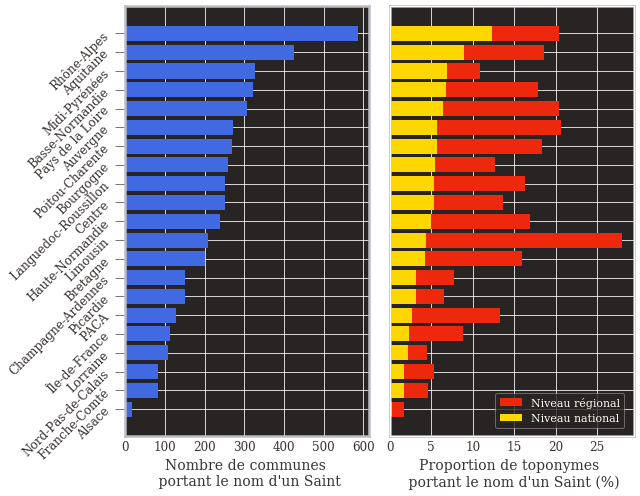

In [92]:
#on regroupe les informations obtenues dans un graphique

style.use('ggplot')

fig= plt.figure(figsize= (9, 7))
ax1= fig.add_subplot(121)
ax2= fig.add_subplot(122, sharey=ax1)
ax2_bis = ax2.twinx() #permet d'afficher deux graphiques sur le même axe

plt.rcParams["font.family"] = "serif"

position = ["left", "right", "top", "bottom"]

for axe in [ax1, ax2] : 
    axe.set_facecolor("#282424")
    for pos in position :
        axe.spines[pos].set_color("#BCBDC5")
        axe.spines[pos].set_linewidth(2.5)

#ylabels
for ylabel1 in ax1.yaxis.get_ticklabels() :
    ylabel1.set_rotation(45)

font_dict = {"family":"serif", "color":"#393432"}
font_dict1 = {"family": "serif", "color": "#393432", "size": 14}
font_dict2 = {"family": "serif", "color": "#393432", "size": 12}

for axe, obj, title, color, label, pad in zip(fig.axes, [saint_fr.Nombre, saint_fr.Proportion,saint_fr["Proportion Nationale"]],\
                                                 ["Nombre de communes \n portant le nom d'un Saint", "Proportion de toponymes \n portant le nom d'un Saint (%)", None],\
                                                 ['#4169E1', "#ED280C", "#FFD700"], [None, "Niveau régional", "Niveau national"], [5, 5, 0]) :
    axe.barh(saint_fr.index, obj, color=color, label=label)
    axe.set_xlabel(title, fontdict= font_dict1, labelpad= pad)
    
    
ax1.set_yticklabels(labels= region_get_name(saint_fr.index), fontdict= font_dict2)
ax1.set_xticklabels(labels= np.arange(0,700, 100), fontdict= font_dict2)
ax2.set_xticklabels(labels= np.arange(0, 35, 5), fontdict= font_dict2)
ax2_bis.set_xticklabels(ax2.get_xticklabels())

ax1.tick_params(axis="y", length=10) 
ax1.tick_params(axis="x", length=0, pad= 4)
ax2.tick_params(labelleft=False)
ax2.tick_params(axis="x", length=0, pad= 4)
ax2.tick_params(axis="y", length=0)
ax2_bis.tick_params(labelright=False)
ax2_bis.tick_params(axis="y", length=0)

ax2_bis.grid(False)

leg = fig.legend(facecolor="#282424", bbox_to_anchor=(0.975,0.12), loc="lower right", borderaxespad=.7, prop={"size": 11})

for text in leg.get_texts():
    text.set_color("#FCFBF1")

#fig.suptitle("Etude de la répartition des communes françaises portant le nom d'un Saint ", fontdict= font_dict, x=.53, y=1.03, fontsize=15.5)

fig.tight_layout()

fig.savefig("saints.png", facecolor=fig.get_facecolor(), bbox_inches="tight")

In [93]:
#On cherche à déterminer la représentation des saints français selon le genre

l=[]
#on coupe les noms selon les tirets, afin d'évaluer si saint est au féminin ou au masculin
for row in df.loc[filt_st].nom.str.split("-") : 
    l.append("Sainte" in row) #on récupère l


In [94]:
#on récupère les occurrences de saints et de saintes

hf = [l.count(False), len(l) - l.count(False)]
labels = ["Homme", "Femme"] 

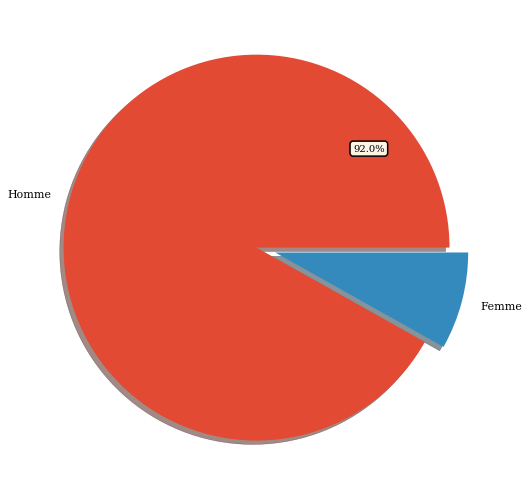

In [95]:
style.use("ggplot")

fig= plt.figure(figsize= (9, 7))
ax= fig.add_subplot(111)

plt.rcParams["font.family"] = "serif"

ax.pie(hf, labels= labels, explode= [0, .1], shadow=True)
bbox_props = dict(boxstyle='round', facecolor="#FDF5E6", edgecolor="k", lw=1.5)
ax.annotate(f'{str(100*round(hf[0]/(hf[0]+hf[1]), 2))}%', xy=(.5, .5), bbox=bbox_props) #(date[15], closep[15]), 
                #xytext=(date[15]+3, closep[15]),


#fig.suptitle("Etude de la répartition des communes françaises portant le nom d'un Saint ", fontdict= font_dict, x=.53, y=1.03, fontsize=15.5)

fig.tight_layout()
fig.savefig("repartition_h_f_saints.png", facecolor=fig.get_facecolor(), bbox_inches="tight")

## Régression logistique sur la région Normandie

### Création de la matrice de régression 

#### Création de l'alphabet pour les digrammes

In [96]:
alphabet = ["a", "b", "c", "d", "e", "f", "g", "h", "i", "j", "k", "l", "m",
            "n", "o", "p", "q", "r", "s", "t", "u", "v", "w", "x", "y", "z", "ä", "à", "é", "è", "ê", "ë", "î", "ï", "ô", "ö", "ç"]
#alphabis = [letter + letter_ for letter in alphabet for letter_ in alphabet]


In [97]:
"""
alphabis = [string.upper() for string in alphabis]
alphabis.append("-")
"""

'\nalphabis = [string.upper() for string in alphabis]\nalphabis.append("-")\n'

#### Code pour obtention de la matrice de régression

In [98]:
#df_letters = pd.DataFrame(np.zeros((df.index.shape[0], len(alphabis))), index=df.index, columns=alphabis)
#initialisation d'une matrice nulle, que l'on va remplir

In [99]:
"""La fonction s'applique sur pd.Series ; elle prend une deuxième pd.Series de type str et regarde si 
celle-ci contient le nom de la série s1, typiquement le nom de s1 est une lettre de l'alphabet ou une chaîne de caractère
"""

def isin(s1, s2=df.nom, case_b=False) :
    s_name = s1.name #on conserve le nom de la série afin de la rebaptiser par la suite
    s1 = s2.str.contains(s1.name, case=case_b) #s1 est transformée en série de booléen, il sagit ici de la série s2 à laquelle on a appliqué la méthode str.contains
    s1.rename(s_name, inplace=True) #on renomme  la série car pour le moment s1.name = s2.name 
    return s1

In [100]:
#df_letters = df_letters.apply(isin).astype("int64") #application de isin sur chaque série de la dataframe df_letters et conversion en int64

In [101]:
#df_letters = df_letters.loc[:, df_letters.sum() != 0]

In [102]:
#df_letters.to_csv("matrix_digramme.csv")

In [103]:
#df_letters = pd.read_csv("matrix_digramme.csv", index_col="insee")

#### Création de la matrice pour les trigrammes

In [104]:
#s = df_letters.pop("-") 
#on récupère la colonne de "-" pour la concaténer par la suite

In [105]:
"""
trigramme = list()
for letter in df_letters.columns :
    for letter_ in alphabet :
        trigramme.append(letter + letter_.upper())"""

'\ntrigramme = list()\nfor letter in df_letters.columns :\n    for letter_ in alphabet :\n        trigramme.append(letter + letter_.upper())'

In [106]:
#triplet = [3*letter.upper() for letter in alphabet]

On s'assure qu'aucun triplet de lettres n'est présent dans un toponyme :

In [107]:
"""
for t in triplet :
    filt_t = df.nom.str.contains(t, case=False)
    print(t, df.loc[filt_t].nom.count()) #donne le triplet et le nombre de nom dans la dataframe contenant le triplet
"""

'\nfor t in triplet :\n    filt_t = df.nom.str.contains(t, case=False)\n    print(t, df.loc[filt_t].nom.count()) #donne le triplet et le nombre de nom dans la dataframe contenant le triplet\n'

In [108]:
#trigramme = [letter for letter in trigramme if letter not in triplet]

In [109]:
#on initialise une matrice de 0
#df_trigramme = pd.DataFrame(np.zeros((df_letters.index.shape[0], len(trigramme)), dtype="uint8"), index=df_letters.index, columns=trigramme)

In [110]:
#on transforme les booléens en entiers codés sur 8 bits afin d'économiser la mémoire

#df_trigramme = df_trigramme.apply(isin).astype("int8") 

In [111]:
#On ne garde que les colonnes contenant au moins une valeur ; on supprime celles ne contenant que des zéros
#df_trigramme = df_trigramme.loc[:, df_trigramme.sum() != 0] 

In [112]:
#df_trigramme = pd.concat([df_trigramme, s], axis=1)

In [113]:
#df_trigramme.to_csv("matrix_trigramme.csv")

# ------------------------------------------------------------------------------------------------

In [114]:
df_trigramme = pd.read_csv("matrix_trigramme.csv", index_col="insee")

In [115]:
df_trigramme

,AAC,AAL,AAR,AAS,ABA,ABB,ABE,ABI,ABJ,ABL,...,ÇAB,ÇAI,ÇAN,ÇAY,ÇOI,ÇOL,ÇON,ÇOT,ÇUB,-
insee,,,,,,,,,,,,,,,,,,,,,
1001,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1002,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1004,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1005,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1006,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95676,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
95678,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
95680,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [116]:
digramme_df = pd.read_csv("matrix_digramme.csv", index_col="insee")

#### Séparation du jeu de données en échantillon d'entraînement et d'évaluation

In [117]:
from sklearn import linear_model as lm
from sklearn.model_selection import train_test_split
import seaborn as sns

In [118]:
#On fait le choix de regrouper Haute et Basse-Normandie
region = df.region.str.contains("HN|BN").astype("int8")

In [119]:
x_log_train, x_log_test, y_log_train, y_log_test = train_test_split(digramme_df, region, random_state=2021)

In [120]:
logistic_reg = lm.LogisticRegression(max_iter=150) #nouvelle instance de la classe LogisticRegression

In [121]:
logistic_reg.fit(x_log_train, y_log_train) #méthode de la classe LogisticRegression

C:\Users\gdori\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=150,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [122]:
prediction = logistic_reg.predict(x_log_test)

In [123]:
score = logistic_reg.score(x_log_test, y_log_test)
score

0.9174859162708494

#### Matrice de confusion

In [124]:
from sklearn import metrics

In [125]:
c_matrix = metrics.confusion_matrix(y_log_test, prediction)

Text(0.5, 1, 'Précision de la prédiction : 91.75%')

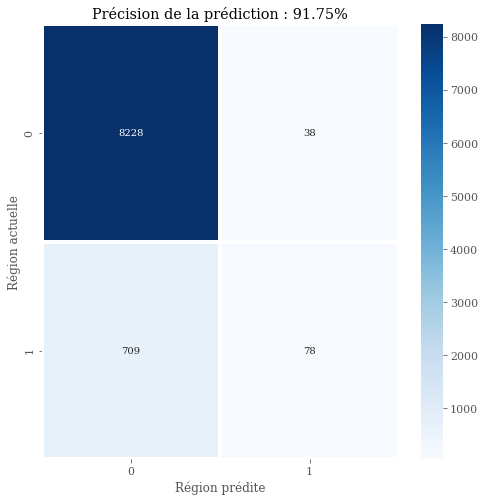

In [126]:
fig = plt.figure(figsize=(8,8))
sns.heatmap(c_matrix, annot=True, cmap="Blues", fmt=".0f", linewidth=3)
plt.ylabel("Région actuelle")
plt.xlabel("Région prédite")
plt.title(f"Précision de la prédiction : {round(score*100, 2)}%")

In [127]:
metrics.r2_score(y_log_test, prediction)

-0.03954426992462512

### Fonctions utiles

In [128]:
def from_word_to_vect(word, alphabet) :
    """Cette fonction transforme un mot en vecteur, selon l'alphabet qu'on lui passe, et selon que des éléments 
    de l'alphabet sont dans le mot. L'alphabet peut être une liste composée d'autant de caractères que l'on souhaite :
    lettres classiques, accentuées, digrammes, trigrammes, tétragrammes etc."""
    
    a = list()
    
    for letter in alphabet :
        a.append(letter in word.upper())
        
    #dtype="int8" convertit automatiquement les booléens en entiers codés sur 8 bits, allégeant l'allocation mémoire
    return(np.array(a, dtype="int8")) 

In [129]:
def predict(word, model, alphabet) :
    
    """Cette fonction utilise la methode predict des differentes classes de modèle de scikit-learn, 
    mais permet de lui passer directement un mot à prédire, selon le modèle utilisé."""
    
    vect = from_word_to_vect(word, alphabet) #transformation de notre mot en vecteur
    
    #il faut ajuster la forme du vecteur afin que celle-ci soit compréhensible de la fonction predict
    vect = vect.reshape(-1, 1).T 
    
    return model.predict(vect) #renvoie la prédiction selon le modèle que nous avons construit

In [130]:
predict("Triffouillis-les-Oies", logistic_reg, digramme_df.columns)

array([0], dtype=int8)

In [131]:
predict("Champignac", logistic_reg, digramme_df.columns)

array([0], dtype=int8)

## Régression logistique sur la matrice des trigrammes

In [132]:
x_logtri_train, x_logtri_test, y_logtri_train, y_logtri_test = train_test_split(df_trigramme, region, random_state=2021)

In [133]:
logistic_reg_tri = lm.LogisticRegression(max_iter=250)

In [134]:
logistic_reg_tri.fit(x_logtri_train, y_logtri_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=250,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [135]:
score_tri = logistic_reg_tri.score(x_logtri_test, y_logtri_test)
score_tri

0.9234507897934386

In [136]:
prediction_tri = logistic_reg_tri.predict(x_logtri_test)

In [137]:
c_matrix_tri = metrics.confusion_matrix(y_logtri_test, prediction_tri)

Text(0.5, 1, 'Précision de la prédiction : 92.35%')

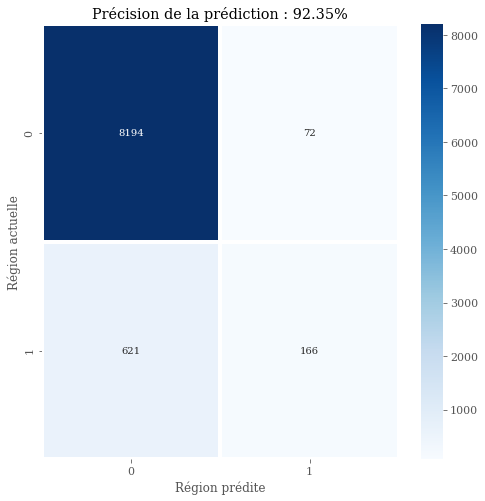

In [138]:
fig = plt.figure(figsize=(8,8))
sns.heatmap(c_matrix_tri, annot=True, cmap="Blues", fmt=".0f", linewidth=3)
plt.ylabel("Région actuelle")
plt.xlabel("Région prédite")
plt.title(f"Précision de la prédiction : {round(score_tri*100, 2)}%")

In [139]:
predict("Trifouillis-les-Oies", logistic_reg_tri, df_trigramme.columns)

array([0], dtype=int8)

In [140]:
predict("Champignac", logistic_reg_tri, df_trigramme.columns)

array([0], dtype=int8)

## Régression catégorielle

Si l'on ne compte pas la Corse, La Coucière (46° 32′ 23″ N, 2° 25′ 49″ E), un endroit situé dans la ville de Vesdun, est
considéré comme étant le centre de la France.

In [141]:
def position(coord) :
    latitude, longitude =  coord[0], coord[1]
    if latitude > 46.53 :
        if longitude > 2.43 : 
            return("NE")
        else :
            return("NO")
    else :
        if longitude > 2.43 : 
            return("SE")
        else :
            return("SO")

In [142]:
df["position"] = df.apply(lambda x : position((x.latitude, x.longitude)), axis=1)

In [143]:
df.position

insee
1001     SE
1002     SE
1004     SE
1005     SE
1006     SE
         ..
95676    NO
95678    NO
95680    NO
95682    NO
95690    NO
Name: position, Length: 36209, dtype: object

In [144]:
regression_position = lm.LogisticRegression(max_iter=250)

In [145]:
x_position_train, x_position_test, y_position_train, y_position_test = train_test_split(df_trigramme, df.position)

In [146]:
regression_position.fit(x_position_train, y_position_train)

C:\Users\gdori\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=250,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [147]:
prediction_pos = regression_position.predict(x_position_test)

In [148]:
c_matrix_pos = metrics.confusion_matrix(y_position_test, prediction_pos)

In [149]:
score_pos = regression_position.score(x_position_test, y_position_test)

Text(0.5, 1, 'Précision de la prédiction : 91.75%')

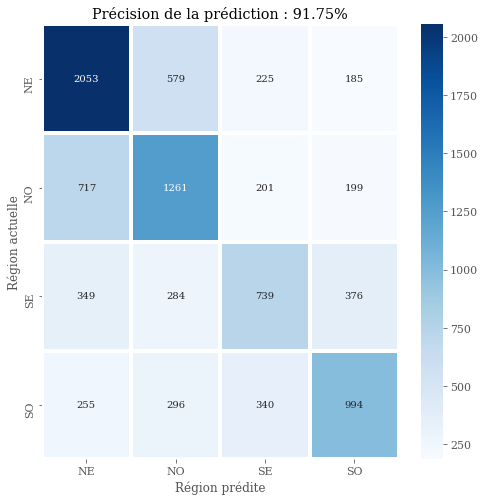

In [150]:
fig = plt.figure(figsize=(8,8))
sns.heatmap(c_matrix_pos, annot=True, cmap="Blues", fmt=".0f", linewidth=3,\
            xticklabels=regression_position.classes_, yticklabels=regression_position.classes_)
plt.ylabel("Région actuelle")
plt.xlabel("Région prédite")
plt.title(f"Précision de la prédiction : {round(score*100, 2)}%")

In [151]:
predict("Trifouillis-les-Oies", regression_position, df_trigramme.columns)

array(['NE'], dtype=object)

In [152]:
predict("Champignac", regression_position, df_trigramme.columns)

array(['SO'], dtype=object)